## SAA Geomagnetic Dynamics

**Introduction**

The South Atlantic Anomaly (SAA) is a well-known phenomenon primarily caused by disturbances in Earth's magnetic field. First documented in 1958, it has deeply intrigued the scientific community, particularly within the fields of space geophysics and aeronomy. Studying such events is crucial to understanding the complex dynamics surrounding our planet and protecting satellites and advanced communication systems that rely on the global magnetic field. We can conclude that the SAA is directly correlated to the operational stability of modern society.

**Objectives**

The main objective of this project is to visualize and confirm the existence of the SAA using independent methods to analyze its behavior and displacement. By comparing these inferences with established scientific data, this study seeks to explore the science behind the anomaly with high accuracy and investigate the intersection between experimental observation and published research. It is important to note that the scientific literature review was conducted after the empirical analysis to avoid reaching biased conclusions.

**South Atlantic Anomaly: A Brief Definition (scientific research)**

The South Atlantic Anomaly is a region of reduced intensity in the Earth's magnetic field, situated over the South Atlantic. In this region, the Van Allen radiation belt, the magnetic structure that traps ionized particles, approaches the Earth, posing threats to technological equipment in the lithosphere. This event represents the most significant anomaly in the geomagnetic field. Historical variations of the SAA have been documented using spherical harmonic field models, elucidating the scale and intensity of this event over the past 500 years.


Although documented for nearly a century, the anomaly has been present for much longer, with some studies suggesting it has occurred for the past 900 years. Throughout this time, this geomagnetic weakness has intensified and migrated westward. The direction of this movement is intrinsically related to geological core dynamics, such as the Coriolis effect and magnetic declination, which intensify this westward drift. Analyzing the gain in intensity is challenging, as it lacks a singular identifiable cause. This dynamic is composed of complex, chaotic movements within the Earth's outer core, influencing magnetic intensity in intricate ways.

**The Empiric Analysis and Methodology**

As stated in the objectives, the primary purpose of this work is to analyze the anomaly using independently acquired data. I developed a program to display an animated graph showing the anomaly from two distinct perspectives, as I believe these two approaches complement each other, providing a more comprehensive understanding.

My initial approach involved acquiring data from reliable sources and plotting them on a 2D map. However, this plan shifted significantly when I discovered the Python library ppigrf, which provides accurate values regarding global magnetic activity since 1900. This tool facilitated the data collection process and proved to be an essential library for this project.

The code utilized for this work is considerably complex compared to my previous projects. I opted for two distinct visualizations of the magnetic field to reinforce the existence of the SAA and understand its behavior from different angles. Furthermore, I utilized Artificial Intelligence to assist in refining and debugging parts of the code.

- First Visualization: Focuses on the intensity of the vertical magnetic lines. These lines follow a path, exiting from the North Pole and entering the South Pole. The expected outcome is a high incidence of magnetic lines at the poles, becoming more subtle toward the equator.

In [25]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from datetime import datetime
import ppigrf
import cartopy.crs as ccrs
import cartopy.feature as cfeature

x = np.linspace(-180, 180, 100)
y = np.linspace(-89.9, 89.9, 50)
X, Y = np.meshgrid(x, y)
                                        
fig, ax = plt.subplots(figsize=(12, 6), subplot_kw={'projection': ccrs.PlateCarree()})


ax.coastlines()
ax.add_feature(cfeature.BORDERS, linestyle=':')

vmin, vmax = -60000, 60000 

date_init = datetime(1900, 1, 1)
_, _, Bu_init = ppigrf.igrf(X, Y, 0, date_init)
Bu_init = Bu_init.squeeze()
                                                                                    
contour = ax.contourf(X, Y, Bu_init, levels=50, cmap='RdBu', vmin=vmin, vmax=vmax, transform=ccrs.PlateCarree())
plt.colorbar(contour, label='Intensity Bu (nT)')
title = ax.set_title(f"Magnetic Field (vertical component) - Year: 1900")

def update(year):
    global contour
    
    contour.remove()

    date = datetime(int(year), 1, 1)
    _, _, Bu = ppigrf.igrf(X, Y, 0, date)
    Z = Bu.squeeze()

    contour = ax.contourf(X, Y, Z, levels=50, cmap='RdBu', vmin=vmin, vmax=vmax)
    title.set_text(f"Magnetic Field (vertical component) - Year: {int(year)}")
    
    return contour

years = np.arange(1900, 2026, 5)

ani = FuncAnimation(
    fig,
    update,
    frames=years,
    interval=200, 
    blit=False
)

plt.close()
#the plot would be broken if showcased in the notebook inside this code cell

This is the code used for the visualization, which outputs a series of alternating images. We can record those and turn the result into a GIF:

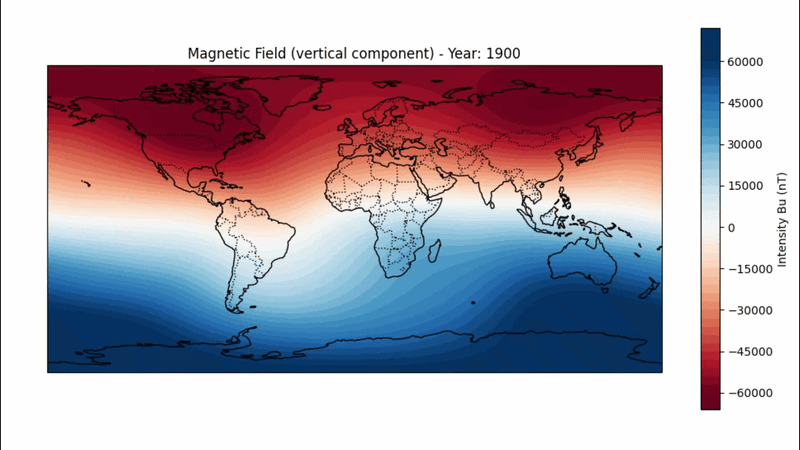

In [38]:
from IPython.display import Image
display(Image(filename='vertical_component_GIF.gif'))

As seen in the animation, near the North Magnetic Pole, a large number of vertical lines exit the region, resulting in negative magnetic intensity. In the south, the opposite occurs: lines enter the region, resulting in positive intensity. The same behavior is observed throughout most of the equator, with almost null force, except for the Atlantic region, where a visible difference in magnetic activity persists. The animation demonstrates that this "earthspot" is migrating westward.

- Second Visualization: Aims to analyze the total intensity of the magnetic field, serving as a tool to comprehend the strength of the Earth's magnetic shield. This approach evaluates the actual intensity of the magnetic lines compared to standard expectations. This representation is highly effective for elucidating the SAA, as it is clearly differentiable from other regions of the field.



In [26]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from datetime import datetime
import ppigrf
import cartopy.crs as ccrs
import cartopy.feature as cfeature

x = np.linspace(-180, 180, 100)
y = np.linspace(-89.9, 89.9, 50)
X, Y = np.meshgrid(x, y)

fig, ax = plt.subplots(figsize=(12, 6), subplot_kw={'projection': ccrs.PlateCarree()})

ax.coastlines()
ax.add_feature(cfeature.BORDERS, linestyle=':')

vmin, vmax = 22000, 65000 

date_init = datetime(1900, 1, 1)
Be, Bn, Bu = ppigrf.igrf(X, Y, 0, date_init)

F_init = np.sqrt(Be**2 + Bn**2 + Bu**2).squeeze()

contour = ax.contourf(X, Y, F_init, levels=50, cmap='cividis', vmin=vmin, vmax=vmax, transform=ccrs.PlateCarree())
plt.colorbar(contour, label="Total Intensity F (nT)")
title = ax.set_title("Total Intensity of the Magnetic Field - Year: 1900")

def update(year):
    global contour
    contour.remove()

    date = datetime(int(year), 1, 1)
    Be, Bn, Bu = ppigrf.igrf(X, Y, 0, date)
    
    Z = np.sqrt(Be**2 + Bn**2 + Bu**2).squeeze()

    contour = ax.contourf(X, Y, Z, levels=50, cmap='cividis', vmin=vmin, vmax=vmax)
    title.set_text(f"Total Intensity of the Magnetic Field - Year: {int(year)}")
    
    return contour

years = np.arange(1900, 2026, 5)

ani = FuncAnimation(
    fig,
    update,
    frames=years,
    interval=50, 
    blit=False
)
plt.close()
#the plot would be broken if showcased in the notebook inside this code cell

The code is, yet again, quite complex. The end result is outputted just like the code in the first approach, a series of images that, when compiled in a GIF, results in the following attachment:

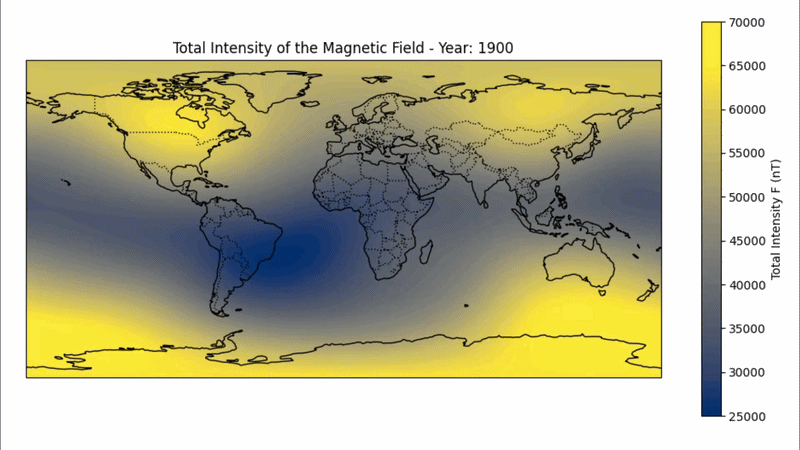

In [37]:
from IPython.display import Image
display(Image(filename='total_intensity_GIF.gif'))

As observed, the gradient represents the strength of the magnetic field around the globe. The unusual spot in the Atlantic is easily discerned: a deep blue shade, representing a weaker magnetic field. One can also observe that this spot is migrating westward.

**Results and Discussion**

These approaches confirm that the South Atlantic Anomaly represents a persistent irregularity in the magnetic field, resulting in a region of reduced magnetic strength. Furthermore, the results indicate that this phenomenon is related to magnetic declination, the difference in position between geographic and magnetic poles. This inference is supported by the first representation, which shows that magnetic line incidence is not perfectly aligned with geographic poles. These instances offer clues into complex behaviors, such as the Coriolis effect within the molten core, contributing to unusual activity in the upper atmosphere.

A comparative analysis between the vertical component (Bu) and the Total Magnetic Intensity (F) reveals a notable spatial discrepancy in the SAA's localization. While both metrics align across the globe, the SAA appears shifted in the Bu analysis compared to the total intensity maps.This discrepancy demonstrates that the SAA is not merely a geometric inclination of field lines, but a phenomenon of reduced magnetic energy. The results confirm that relying on isolated components, such as Bu, provides only a partial view of geomagnetic anomalies. Consequently, analyzing the full magnetic vector (F) is essential to accurately define the spatial extent of the SAA, proving that this anomaly is fundamentally a reduction in the total magnitude of the Earth's magnetic shield.

Such findings are consistent with established scientific studies, as I could derive accurate inferences through my independent methodology. It is important to emphasize that while my methods are effective, they could be further refined in the future to yield even more precise analyses.


**Conclusion**

The Earth's magnetic field is one of the most fascinating and vital aspects of our planet's dynamic systems. In this context, the South Atlantic Anomaly serves as a crucial link between our planet's two boundaries: the geological core and the upper atmosphere. Analyzing this phenomenon proved challenging yet incredibly rewarding. This experience was fundamental in demonstrating how science and technology complement one another to elucidate the world around us.

**References (research)**

Hartmann, G. A., & Pacca, I. G. (2009). Time evolution of the South Atlantic Magnetic Anomaly. *Anais da Academia Brasileira de Ciências*, 81(2), 243–255. https://doi.org/10.1590/s0001-37652009000200010

Pavón-Carrasco, F. J., & De Santis, A. (2016). The South Atlantic Anomaly: The Key for a Possible Geomagnetic Reversal. *Frontiers in Earth Science*, 4, 40. https://doi.org/10.3389/feart.2016.00040

Shirah, G., & Kuang, W. (2020). *NASA Scientific Visualization Studio*. Retrieved May 22, 2026, from https://svs.gsfc.nasa.gov/4840/